In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
df = pd.read_csv(r'C:\Users\ASUS\Desktop\DataScience\Code\dataAnalysys\datasets\tumour.csv')
df.sample(5)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
73,859983,M,13.80,15.79,90.43,584.1,0.10070,0.12800,0.07789,0.05069,...,20.86,110.30,812.4,0.1411,0.3542,0.2779,0.13830,0.2589,0.10300,NaN
430,907914,M,14.90,22.53,102.10,685.0,0.09947,0.22250,0.27330,0.09711,...,27.57,125.40,832.7,0.1419,0.7090,0.9019,0.24750,0.2866,0.11550,NaN
512,915691,M,13.40,20.52,88.64,556.7,0.11060,0.14690,0.14450,0.08172,...,29.66,113.30,844.4,0.1574,0.3856,0.5106,0.20510,0.3585,0.11090,NaN
344,89864002,B,11.71,15.45,75.03,420.3,0.11500,0.07281,0.04006,0.03250,...,18.16,84.16,516.4,0.1460,0.1115,0.1087,0.07864,0.2765,0.07806,NaN
395,903811,B,14.06,17.18,89.75,609.1,0.08045,0.05361,0.02681,0.03251,...,25.34,96.42,684.5,0.1066,0.1231,0.0846,0.07911,0.2523,0.06609,NaN


In [23]:
print(df.shape)

(569, 32)


In [ ]:
df = df.drop('Unnamed: 32', axis=1) #dropping useless columns

In [19]:
df.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [21]:
df.duplicated().sum()

0

In [24]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

<Axes: xlabel='diagnosis', ylabel='percent'>

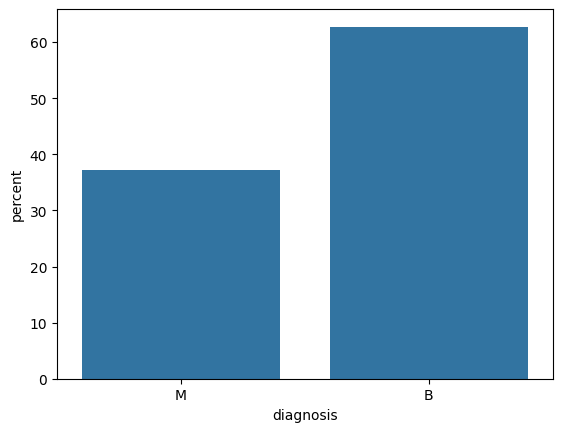

In [ ]:
sns.countplot(x=df['diagnosis'],stat='percent')  #this shows that chances of a tumour being malignant is less than it being benign. 

count    569.000000
mean       0.181162
std        0.027414
min        0.106000
25%        0.161900
50%        0.179200
75%        0.195700
max        0.304000
Name: symmetry_mean, dtype: float64


(array([  5.,  35., 133., 164., 136.,  60.,  21.,  10.,   3.,   2.]),
 array([0.106 , 0.1258, 0.1456, 0.1654, 0.1852, 0.205 , 0.2248, 0.2446,
        0.2644, 0.2842, 0.304 ]),
 <BarContainer object of 10 artists>)

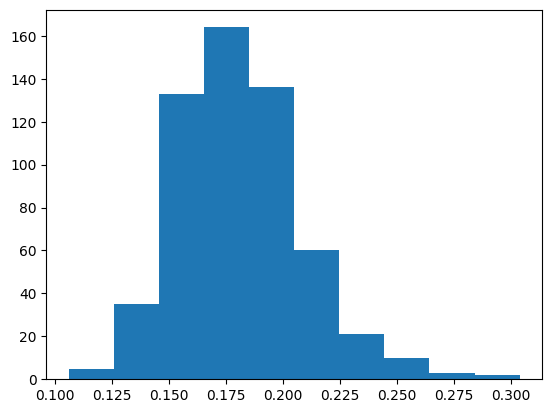

In [ ]:
print(df.describe()['symmetry_mean'])
plt.hist(df['symmetry_mean'])  

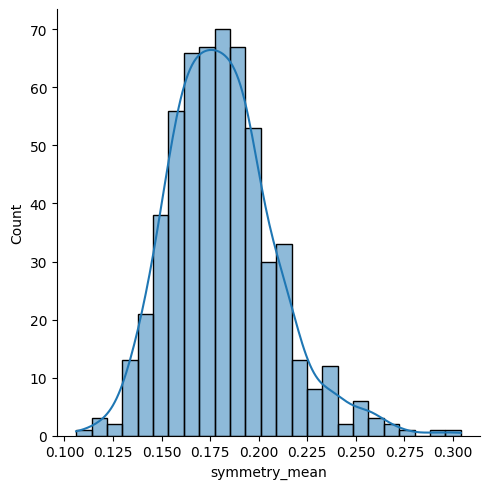

In [44]:
sns.displot(df['symmetry_mean'],kde=True) #just another way of visualizing the data we could have just used kdeplot instead,but i can see outliers in this lets deal with them before seeing its relationship with diagnosis

<Axes: xlabel='symmetry_mean'>

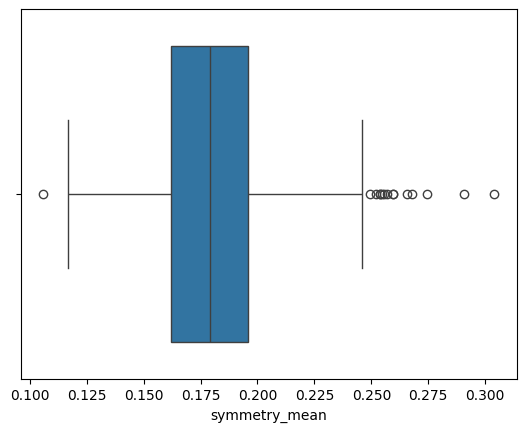

In [45]:
sns.boxplot(x=df['symmetry_mean']) #for some reason we have a lot of outliers for higher symmetry suggesting many tumours are extremely symmetrical, now lets jump to the interesting part and see its relation with diagnosis.

<Axes: xlabel='diagnosis', ylabel='symmetry_mean'>

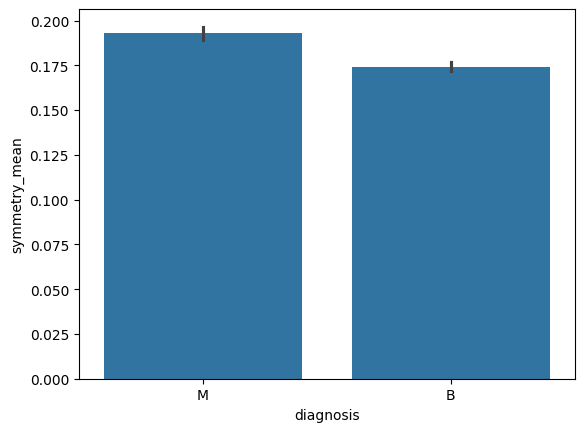

In [ ]:
sns.barplot(y='symmetry_mean', x='diagnosis', data=df) #so we can see benign tumour's symmetry_mean is little less than malignant but thats odd because my understanding says that cancerous tumours are generally assymetrical, lets do more digging

<Axes: xlabel='diagnosis', ylabel='symmetry_mean'>

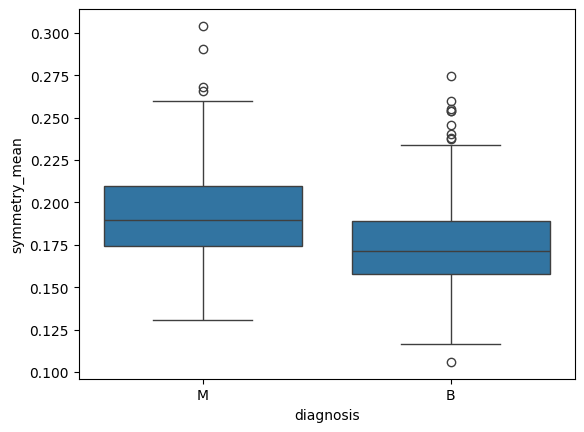

In [ ]:
sns.boxplot(y='symmetry_mean', x='diagnosis', data=df) #their IQR overlaps little bit so this feature is alone not sufficient for prediction, also we can see symmetry mean is higher for malignant than benign. IQR of Malignant is slightly larger than IQR of benign, at end we can also see both data have outliers.

<Axes: xlabel='symmetry_mean', ylabel='Probability'>

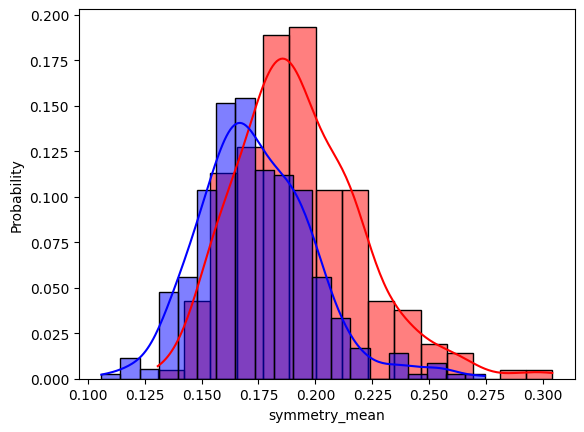

In [ ]:
# sns.displot(df[df['diagnosis']=='M']['symmetry_mean'],kde=True)
# sns.displot(df[df['diagnosis']=='B']['symmetry_mean'],kde=True)
sns.histplot(df[df['diagnosis']=='M']['symmetry_mean'], color='red', stat='probability', label='Malignant', kde=True)
sns.histplot(df[df['diagnosis']=='B']['symmetry_mean'], color='blue', stat='probability', label='Benign', kde=True)
#ok we get interesting observation from this when symmetry_mean is < 0.170 probability of a tumour being benign is higher than it being malignant, but when symmetry_mean > 0.170 probability of it being malignant increases rapidly over it being benign and at higher symmetry_mean >0.250 probability gets closer to each other again.

In [ ]:
#but we have many features here we cant do all permutations and combination to check for relations.
#so we use
sns.pairplot(df)

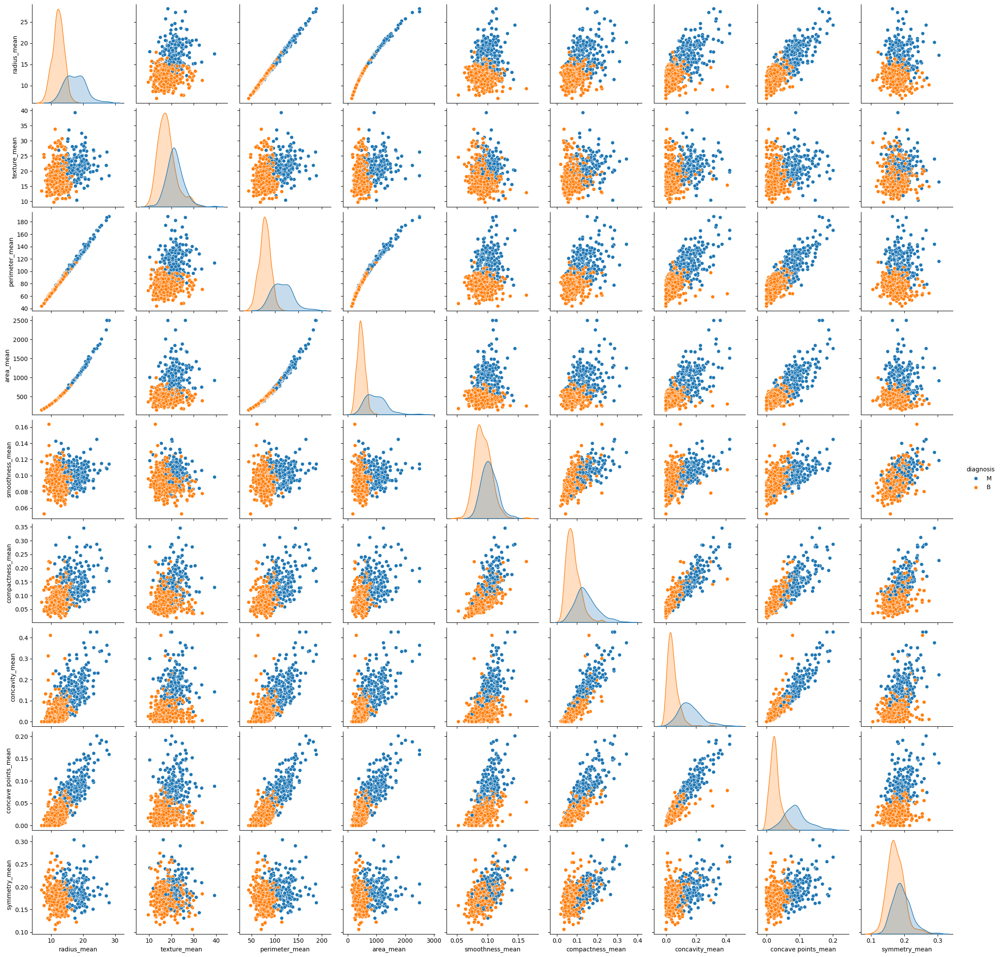

In [ ]:
#ok had a little whoopsie, too many columns
df1 = df[["diagnosis","radius_mean","texture_mean","perimeter_mean","area_mean","smoothness_mean","compactness_mean","concavity_mean","concave points_mean","symmetry_mean"]]
sns.pairplot(df1,hue='diagnosis')
#beautiful isn't it!
#we can make two very important observations here 1. data can be clustered as malignant and benign are separated. 2. on diagonal we can see kde of some columns are similar meaning they have positive correlation, so we will now check for correlation in our data

<Axes: >

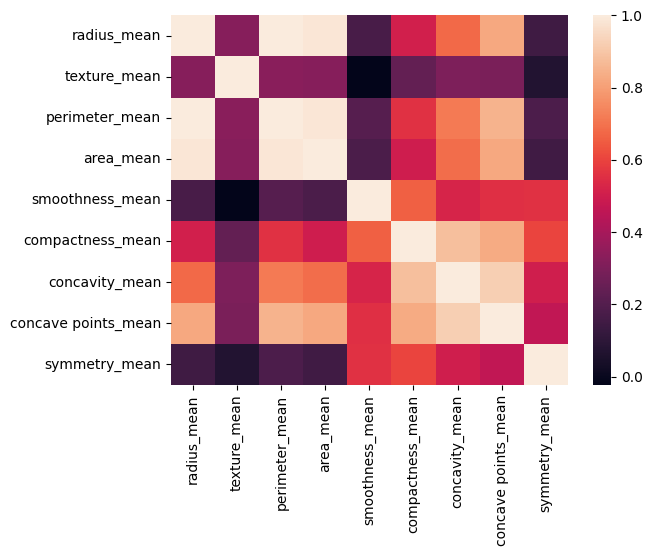

In [ ]:
df1=df1.drop('diagnosis',axis=1)
sns.heatmap(df1.corr())
#we can clearly see highlt correlated features, which can later be combined or removed to reduce dimentionality, we can also see some strong negative correlation.

Now we have done basic analysis of the data, next step would be to do feature engineering and select a ML model but since this is a mini project i will stop here.